<a href="https://colab.research.google.com/github/RC11-SkillsClass2022-23/LingjunZhou/blob/main/SkillClass_VideosClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install --upgrade moviepy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 388 kB 7.9 MB/s 
     |████████████████████████████████| 26.9 MB 16.5 MB/s 
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110742 sha256=788f365b306835acfc1f61ac99e51d0cfc8f3b01a6df38ad6cdd05237d54ba12
  Stored in directory: /root/.cache/pip/wheels/e4/a4/db/0368d3a04033da662e13926594b3a8cf1aa4ffeefe570cfac1
Successfully built moviepy
  Attempting uninstall: moviepy
    Found existing installation: moviepy 0.2.3.5
    Uninstalling moviepy-0.2.3.5:
      Successfully uninstalled moviepy-0.2.3.5


In [2]:
! git clone https://github.com/kenshohara/video-classification-3d-cnn-pytorch.git

Cloning into 'video-classification-3d-cnn-pytorch'...
remote: Enumerating objects: 121, done.
remote: Total 121 (delta 0), reused 0 (delta 0), pack-reused 121
Receiving objects: 100% (121/121), 158.63 KiB | 7.93 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [3]:
%cd video-classification-3d-cnn-pytorch/
!pwd

/content/video-classification-3d-cnn-pytorch
/content/video-classification-3d-cnn-pytorch


In [4]:
import json
import os
from moviepy.editor import *
from moviepy import *

In [5]:
def LoadVideosToFile(folder):
  videos = os.listdir(folder)
  with open('input', 'w') as inputfile:
    for v in videos:
      if v.split('.')[-1] == 'mp4':
        inputfile.write(v+'\n')

In [7]:
LoadVideosToFile('/content/drive/MyDrive/SkillClass/Video/VideoToProcess')

In [8]:
! python main.py --input input --video_root /content/drive/MyDrive/SkillClass/Video/VideoToProcess --output /content/drive/MyDrive/SkillClass/Video/VideoOut/output.json --model /content/drive/MyDrive/SkillClass/resnet-34-kinetics-cpu.pth --model_depth 34  --no_cuda --mode score --resnet_shortcut A

loading model /content/drive/MyDrive/SkillClass/resnet-34-kinetics-cpu.pth
/content/drive/MyDrive/SkillClass/Video/VideoToProcess/homealone.mp4
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-l

In [9]:
! python generate_result_video/generate_result_video.py /content/drive/MyDrive/SkillClass/Video/VideoOut/output.json /content/drive/MyDrive/SkillClass/Video/VideoToProcess /content/drive/MyDrive/SkillClass/Video/Video_pred class_names_list 5

/content/drive/MyDrive/SkillClass/Video/VideoToProcess/homealone.mp4
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-l

In [10]:
file = open('/content/drive/MyDrive/SkillClass/Video/VideoOut/output.json')
segments = json.load(file)

In [11]:
print(len(segments))

2


In [12]:
segments[0].keys()

dict_keys(['video', 'clips'])

In [13]:
segments[1]['video']

'mushu.mp4'

In [14]:
segments[0]['clips'][0].keys()

dict_keys(['segment', 'label', 'scores'])

In [15]:
segments[1]['clips'][1].keys()

dict_keys(['segment', 'label', 'scores'])

In [16]:
segments[0]['clips'][0]['segment']

[1, 16]

In [17]:
segments[1]['clips'][1]['segment']

[17, 32]

In [18]:
segments[0]['clips'][0]['label']

'jogging'

In [19]:
segments[1]['clips'][1]['label']

'parkour'

In [20]:
segments[0]['clips'][0]['scores'][0]

1.4403488636016846

In [21]:
segments[1]['clips'][1]['scores'][1]

1.0142163038253784

In [22]:
len(segments[0]['clips'][0]['scores'])

400

In [23]:
classNames = []
with open('class_names_list', 'r') as class_names_list:
  index = 0
  for c in class_names_list:
    classNames.append({'index':index, 'name':c, 'score':0})
    index += 1


In [25]:
for i in range(len(segments[1]['clips'][1]['scores'])):
  score = segments[1]['clips'][1]['scores'][i]
  classNames[i]['score'] = score

In [26]:
classNames.sort(key = lambda x : x['score'], reverse = True)

In [27]:
classNames[0:5]

[{'index': 207, 'name': 'parkour\n', 'score': 5.645488739013672},
 {'index': 313, 'name': 'slacklining\n', 'score': 5.423146724700928},
 {'index': 68, 'name': 'climbing tree\n', 'score': 5.079411029815674},
 {'index': 302, 'name': 'side kick\n', 'score': 4.675784587860107},
 {'index': 49,
  'name': 'catching or throwing frisbee\n',
  'score': 4.520205497741699}]

In [28]:
for i in range(len(segments[0]['clips'][0]['scores'])):
  score = segments[0]['clips'][0]['scores'][i]
  classNames[i]['score'] = score

In [29]:
classNames.sort(key = lambda x : x['score'], reverse = True)

In [30]:
classNames[0:5]

[{'index': 347, 'name': 'taking a shower\n', 'score': 12.01777172088623},
 {'index': 389, 'name': 'waxing legs\n', 'score': 7.418013572692871},
 {'index': 395, 'name': 'wrestling\n', 'score': 7.226463794708252},
 {'index': 383, 'name': 'water skiing\n', 'score': 6.828843116760254},
 {'index': 10, 'name': 'baby waking up\n', 'score': 6.527693748474121}]

In [31]:
video = VideoFileClip(r"/content/drive/MyDrive/SkillClass/Video/VideoToProcess/mushu.mp4")
subVideo = video.subclip(30,40)
subVideo.write_videofile("/content/drive/MyDrive/SkillClass/Video/VideoOut/mushu.mp4", audio_codec='aac')

Moviepy - Building video /content/drive/MyDrive/SkillClass/Video/VideoOut/mushu.mp4.
MoviePy - Writing audio in mushuTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/drive/MyDrive/SkillClass/Video/VideoOut/mushu.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/MyDrive/SkillClass/Video/VideoOut/mushu.mp4


In [32]:
subVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [33]:
video.fps

30.0

In [34]:
frame_length = 1/video.fps

In [35]:
label_periods = []
for f in segments:
  print(f['video'])
  currentLabel = None
  ts = 0
  te = 0
  for c in f['clips']:
    label = c['label']
    s = c['segment'][0]
    e = c['segment'][1]
    if label == currentLabel:
      te = e 
    else:
      label_periods.append([(ts,te),currentLabel])

      ts = s
      te = e 
      currentLabel = label

homealone.mp4
mushu.mp4


In [36]:
label_periods

[[(0, 0), None],
 [(1, 16), 'jogging'],
 [(17, 32), 'jumpstyle dancing'],
 [(33, 48), 'shot put'],
 [(49, 64), 'playing chess'],
 [(65, 160), 'bartending'],
 [(161, 176), 'playing saxophone'],
 [(177, 192), 'motorcycling'],
 [(193, 208), 'extinguishing fire'],
 [(209, 224), 'motorcycling'],
 [(225, 240), 'extinguishing fire'],
 [(241, 256), 'bartending'],
 [(257, 272), 'playing organ'],
 [(273, 288), 'recording music'],
 [(289, 304), 'playing violin'],
 [(305, 320), 'smoking hookah'],
 [(321, 368), 'playing poker'],
 [(369, 464), 'decorating the christmas tree'],
 [(465, 512), 'kissing'],
 [(513, 528), 'celebrating'],
 [(529, 560), 'decorating the christmas tree'],
 [(561, 592), 'cleaning windows'],
 [(593, 640), 'decorating the christmas tree'],
 [(641, 656), 'crying'],
 [(657, 688), 'playing poker'],
 [(689, 720), 'crying'],
 [(721, 736), 'playing poker'],
 [(737, 752), 'tasting beer'],
 [(753, 768), 'smoking hookah'],
 [(769, 800), 'tasting beer'],
 [(801, 816), 'smoking hookah'],
 

In [37]:
len(label_periods)

110

In [46]:
longPeriods = []
for lp in label_periods:
  if lp[0][1]-lp[0][0] > 3/frame_length:
    longPeriods.append(lp)

In [47]:
longPeriods

[[(65, 160), 'bartending'], [(369, 464), 'decorating the christmas tree']]

In [48]:
clips = []
for l in longPeriods:
  subclip = video.subclip(l[0][0]*frame_length,l[0][1]*frame_length)
  clips.append([subclip,l[1]+'_'+str(int(l[0][0]*frame_length))])

In [49]:
clips

[[<moviepy.video.io.VideoFileClip.VideoFileClip at 0x7fd37c169070>,
  'bartending_2'],
  'decorating the christmas tree_12']]

In [50]:
clips[0][0].ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [51]:
folderPath = '/content/drive/MyDrive/SkillClass/Video/VideoOut'
for c in clips:
  c[0].write_videofile(folderPath + c[1] + '.mp4', audio_codec='aac')

Moviepy - Building video /content/drive/MyDrive/SkillClass/Video/VideoOutbartending_2.mp4.
MoviePy - Writing audio in VideoOutbartending_2TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/drive/MyDrive/SkillClass/Video/VideoOutbartending_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/MyDrive/SkillClass/Video/VideoOutbartending_2.mp4
Moviepy - Building video /content/drive/MyDrive/SkillClass/Video/VideoOutdecorating the christmas tree_12.mp4.
MoviePy - Writing audio in VideoOutdecorating the christmas tree_12TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/drive/MyDrive/SkillClass/Video/VideoOutdecorating the christmas tree_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/MyDrive/SkillClass/Video/VideoOutdecorating the christmas tree_12.mp4


**Features**

In [52]:
def LoadVideosToFile(folder):
  videos = os.listdir(folder)
  with open('input', 'w') as inputfile:
    for v in videos:
      if v.split('.')[-1] == 'mp4':
        inputfile.write(v+'\n')

In [53]:
LoadVideosToFile('/content/drive/MyDrive/SkillClass/Video/VideoToProcess')

In [118]:
!python main.py --input input --video_root /content/drive/MyDrive/SkillClass/Video/VideoToProcess --output /content/drive/MyDrive/SkillClass/outputKAndMsFeatures.json --model /content/drive/MyDrive/SkillClass/resnet-34-kinetics-cpu.pth --model_depth 34 --mode feature --resnet_shortcut A --no_cuda

loading model /content/drive/MyDrive/SkillClass/resnet-34-kinetics-cpu.pth
/content/drive/MyDrive/SkillClass/Video/VideoToProcess/mushu.mp4
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtw

In [84]:
def readAllOutput(outputFolder):
    dictionaries = {}
    filename = os.listdir(outputFolder)
    for f in filename:
      if f.split('.')[-1] == 'json':
        file = open(outputFolder + '/' + f)
        segments = json.load(file)
        for s in segments:
          dictionaries[s['video']] = s
    
    return dictionaries

In [85]:
dicts = readAllOutput('/content/drive/MyDrive/SkillClass/Video/VideoOut')
dicts.keys()

dict_keys(['mushu.mp4', 'king.mp4'])

In [86]:
dicts['mushu.mp4']['clips'][0].keys()

dict_keys(['segment', 'features'])

In [87]:
def searchForMatch(keyFilmName, featureDictionary):
    bestRangeStart = 0
    bestRangeFilmName = ''
    bestRangeScore = 1000000000

    keyClips = featureDictionary[keyFilmName]['clips']
    keyFeatures = []
    for c in keyClips:
      keyFeatures.append(np.array(c['features']))
  
    for film in featureDictionary.keys():
        if not film == keyFilmName:
          filmClips = featureDictionary[film]['clips']
          filmFeatures = []
          for c in filmClips:
            filmFeatures.append(np.array(c['features']))
          for i in range(len(filmFeatures)-len(keyFeatures)):
            distance = 0
            for j in range(len(keyFeatures)):
              d = np.linalg.norm(filmFeatures[i+j]-keyFeatures[j])
              distance += d
              if distance < bestRangeScore:
                bestRangeScore = distance
                bestRangeStart = i
                bestRangeFilmName = film
                      
    matchingFragment = [bestRangeFilmName, bestRangeStart, len(keyFeatures)]
    
    return matchingFragment

In [88]:
import numpy as np

In [89]:
matchingFragment = searchForMatch("mushu.mp4", dicts)

In [90]:
def extractFragment(fragment, filmFolder):
    
    filmFileName = fragment[0]
    start = fragment[1]
    nrClips = fragment[2]
    
    filmPath = os.path.join(filmFolder, filmFileName)
    print(filmPath)
    filmVideo = VideoFileClip(filmPath)
    filmfps = filmVideo.fps
    filmFrameLength = 1/filmfps
    
    nrFrames = nrClips * 16
    startFrame = start * 16
    
    startTime = startFrame * filmFrameLength
    endTime = startTime + nrFrames * filmFrameLength
    
    filmMatchedVideo = filmVideo.subclip(startTime, endTime)
    
    
    return filmMatchedVideo

In [91]:
input_films_processed = os.listdir('/content/drive/MyDrive/SkillClass/Video/VideoToProcess')
for file in input_films_processed:
    try:
        shutil.move(os.path.join('/content/drive/MyDrive/SkillClass/Video/VideoProcessed',file),'/content/drive/MyDrive/SkillClass/Video/VideoProcessed')
    except:
        print(file + ' not moved')

mushu.mp4 not moved
king.mp4 not moved


In [93]:
dicts = readAllOutput('/content/drive/MyDrive/SkillClass/Video/VideoOut')
dicts.keys()

dict_keys(['mushu.mp4', 'king.mp4'])

In [96]:
fragment = searchForMatch('king.mp4', dicts)
fragment

['mushu.mp4', 53, 16]

In [103]:
filmFolder = '/content/drive/MyDrive/SkillClass/Video/VideoToProcess'
MsMatchedKVideo = extractFragment(fragment, filmFolder)

/content/drive/MyDrive/SkillClass/Video/VideoToProcess/mushu.mp4


In [104]:
MsMatchedKVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [105]:
MsMatchedKVideo.write_videofile("/content/drive/MyDrive/SkillClass/Video/output/MsMatchedKVideofragment.mp4", audio_codec='aac')

Moviepy - Building video /content/drive/MyDrive/SkillClass/Video/output/MsMatchedKVideofragment.mp4.
MoviePy - Writing audio in MsMatchedKVideofragmentTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/drive/MyDrive/SkillClass/Video/output/MsMatchedKVideofragment.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/MyDrive/SkillClass/Video/output/MsMatchedKVideofragment.mp4


In [106]:
MsMatchedKVideo.duration

8.533333333333331

In [110]:
frame = MsMatchedKVideo.get_frame(8.5)

In [111]:
from PIL import Image

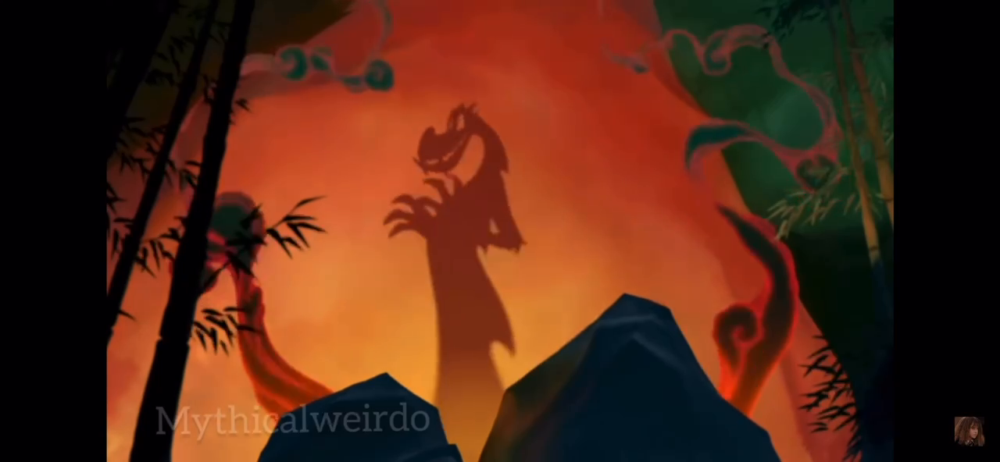

In [112]:
Image.fromarray(frame,'RGB')

In [119]:
file = open('/content/drive/MyDrive/SkillClass/Video/VideoOut/outputKAndMsFeatures.json')
segments = json.load(file)

In [120]:
ImageFeatures = []
for s in segments[0]['clips']:
  ImageFeatures.append(np.array(s['features']))

In [121]:
ImageFeatures[0]

array([2.05879498e+00, 4.66231495e-01, 1.53159931e-01, 3.53225052e-01,
       8.99549484e-01, 1.13659966e+00, 0.00000000e+00, 8.97771358e-01,
       1.91084221e-01, 1.08880985e+00, 1.36326921e+00, 2.37583801e-01,
       1.96303916e+00, 5.39961278e-01, 2.70988178e+00, 1.76383758e+00,
       1.96814835e+00, 2.07766819e+00, 1.73332882e+00, 2.40060717e-01,
       7.07279980e-01, 2.11915508e-01, 0.00000000e+00, 7.49218240e-02,
       1.19917482e-01, 1.39995128e-01, 1.45508826e-01, 8.12396109e-01,
       3.24566221e+00, 1.13808878e-01, 1.24963951e+00, 5.05973473e-02,
       3.20150089e+00, 0.00000000e+00, 5.73557019e-01, 5.77252984e-01,
       3.23733330e-01, 2.87672013e-01, 8.24373364e-01, 3.48616213e-01,
       4.52811003e-01, 7.99768209e-01, 8.17044377e-02, 1.62277746e+00,
       1.24821222e+00, 0.00000000e+00, 6.13636784e-02, 1.08084333e+00,
       1.09263696e-01, 1.01110566e+00, 6.89294398e-01, 2.74567652e+00,
       3.84710822e-03, 8.17496121e-01, 9.11798596e-01, 1.33919823e+00,
      

In [122]:
VideoFeatures = []
for s in segments[1]['clips']:
  VideoFeatures.append(np.array(s['features']))

In [127]:
bestRangeStart = 0
bestRangeScore = 1000000000
for i in range(len(VideoFeatures)-len(ImageFeatures)):
  distance = 0
  for j in range(len(VideoFeatures)):
    d = np.linalg.norm(VideoFeatures[i+j]-ImageFeatures[j])
    distance += d
    print(diatance)
    if distance < bestRangeScore:
      bestRangeScore = distance
      bestRangeStart = i

In [130]:
def matchbest(targetFeatures, findingFeatures):
  bestRangeStart = 0
  bestRangeScore = 1000000000000
  for i in range(len(findingFeatures)-len(targetFeatures)):
    distance = 0
    for j in range(len(targetFeatures)):
      d = np.linalg.norm(findingFeatures[i+j]-targetFeatures[j])
      distance += d

      if distance < bestRangeScore:
        bestRangeScore = distance
        bestRangeStart = i
  return bestRangeStart

In [131]:
bestRangeStart= matchbest (VideoFeatures,ImageFeatures)
print(bestRangeStart)

53


In [132]:
ImageFeatures[0]

array([2.05879498e+00, 4.66231495e-01, 1.53159931e-01, 3.53225052e-01,
       8.99549484e-01, 1.13659966e+00, 0.00000000e+00, 8.97771358e-01,
       1.91084221e-01, 1.08880985e+00, 1.36326921e+00, 2.37583801e-01,
       1.96303916e+00, 5.39961278e-01, 2.70988178e+00, 1.76383758e+00,
       1.96814835e+00, 2.07766819e+00, 1.73332882e+00, 2.40060717e-01,
       7.07279980e-01, 2.11915508e-01, 0.00000000e+00, 7.49218240e-02,
       1.19917482e-01, 1.39995128e-01, 1.45508826e-01, 8.12396109e-01,
       3.24566221e+00, 1.13808878e-01, 1.24963951e+00, 5.05973473e-02,
       3.20150089e+00, 0.00000000e+00, 5.73557019e-01, 5.77252984e-01,
       3.23733330e-01, 2.87672013e-01, 8.24373364e-01, 3.48616213e-01,
       4.52811003e-01, 7.99768209e-01, 8.17044377e-02, 1.62277746e+00,
       1.24821222e+00, 0.00000000e+00, 6.13636784e-02, 1.08084333e+00,
       1.09263696e-01, 1.01110566e+00, 6.89294398e-01, 2.74567652e+00,
       3.84710822e-03, 8.17496121e-01, 9.11798596e-01, 1.33919823e+00,
      

In [134]:
ImageFeatures[bestRangeStart]

array([4.48520803e+00, 9.96460021e-02, 2.74787135e-02, 1.44764674e+00,
       5.77368081e-01, 2.38415018e-01, 3.67850721e-01, 6.00663841e-01,
       4.32881236e-01, 8.66271034e-02, 4.12824780e-01, 1.33212164e-01,
       4.59285676e-02, 1.31977960e-01, 9.37371314e-01, 0.00000000e+00,
       1.10724485e+00, 5.40739536e-01, 7.96724498e-01, 6.56706840e-03,
       4.37833741e-02, 9.42082047e-01, 3.05528492e-01, 2.42104724e-01,
       5.69297850e-01, 7.64287651e-01, 3.06069050e-02, 3.54873151e-01,
       3.63919640e+00, 2.51143873e-01, 8.21422562e-02, 1.19373500e+00,
       9.75056887e-01, 1.12566002e-01, 7.73983121e-01, 1.46459997e-01,
       1.49701571e+00, 4.60618436e-01, 2.05487013e-02, 1.17712095e-02,
       3.90934534e-02, 7.78352916e-02, 4.06653546e-02, 1.31066382e+00,
       2.71669235e-02, 1.03292577e-02, 1.22349132e-02, 7.57219493e-01,
       4.79034074e-02, 3.53450328e-01, 2.17951804e-01, 6.54912055e-01,
       1.58410013e+00, 1.33515090e-01, 1.03831887e-01, 1.06193915e-01,
      

In [156]:
def matchVideo(vpath, features, bestRangeStart):
  Rvideo = VideoFileClip(vpath)
  Rfps = Rvideo.fps
  RFrameLength = 1/Rfps

  nrFrames = len(features)*16
  startFrame = bestRangeStart*16

  startTime = startFrame*RFrameLength
  endTime = startTime+nrFrames*RFrameLength

  RMatchedVideo = Rvideo.subclip(startTime,endTime)
  return RMatchedVideo

In [172]:
matchVideo('/content/drive/MyDrive/SkillClass/Video/homealone.mp4', VideoFeatures, 8)

In [173]:
matchVideo('/content/drive/MyDrive/SkillClass/Video/homealone.mp4', VideoFeatures, 8).ipython_display()











chunk:  19%|█▉        | 43/228 [05:55<25:27,  8.26s/it, now=None]



chunk:  72%|███████▏  | 137/189 [04:41<00:00, 975.82it/s, now=None]

chunk:  78%|███████▊  | 148/189 [03:55<00:00, 886.13it/s, now=None]












chunk:  19%|█▉        | 43/228 [05:55<25:27,  8.26s/it, now=None]



chunk:  72%|███████▏  | 137/189 [04:41<00:00, 975.82it/s, now=None]

chunk:  78%|███████▊  | 148/189 [03:55<00:00, 886.13it/s, now=None]


chunk:  91%|█████████ | 172/189 [02:05<00:00, 840.02it/s, now=None]

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3







chunk:   0%|          | 0/236 [00:00<?, ?it/s, now=None]




chunk:  17%|█▋        | 40/236 [00:00<00:00, 395.23it/s, now=None]




chunk:  58%|█████▊    | 137/236 [00:00<00:00, 727.61it/s, now=None]




chunk: 100%|█████████▉| 235/236 [00:00<00:00, 840.87it/s, now=None]














chunk:  19%|█▉        | 43/228 [05:55<25:29,  8.27s/it, now=None]



chunk:  72%|███████▏  | 137/189 [04:42<00:00, 975.82it/s, now=None]

chunk:  78%|███████▊  | 148/189 [03:55<00:00, 886.13it/s, now=None]












chunk:  19%|█▉        | 43/228 [05:55<25:29,  8.27s/it, now=None]



chunk:  72%|███████▏  | 137/189 [04:42<00:00, 975.82it/s, now=None]

chunk:  78%|███████▊  | 148/189 [03:55<00:00, 886.13it/s, now=None]


chunk:  91%|█████████ | 172/189 [02:06<00:00, 840.02it/s, now=None]

MoviePy - Done.
Moviepy - Writing video __temp__.mp4








t:   0%|          | 0/256 [00:00<?, ?it/s, now=None]




t:   2%|▏         | 5/256 [00:00<00:05, 44.55it/s, now=None]




t:   4%|▍         | 10/256 [00:00<00:05, 43.97it/s, now=None]




t:   6%|▌         | 15/256 [00:00<00:05, 40.83it/s, now=None]




t:   9%|▉         | 23/256 [00:00<00:04, 52.10it/s, now=None]




t:  12%|█▏        | 31/256 [00:00<00:03, 59.78it/s, now=None]




t:  15%|█▌        | 39/256 [00:00<00:03, 65.56it/s, now=None]




t:  18%|█▊        | 47/256 [00:00<00:03, 67.89it/s, now=None]




t:  21%|██        | 54/256 [00:00<00:03, 66.17it/s, now=None]




t:  24%|██▍       | 61/256 [00:01<00:03, 63.33it/s, now=None]




t:  27%|██▋       | 68/256 [00:01<00:02, 64.96it/s, now=None]




t:  29%|██▉       | 75/256 [00:01<00:02, 64.48it/s, now=None]




t:  32%|███▏      | 82/256 [00:01<00:02, 62.41it/s, now=None]




t:  35%|███▍      | 89/256 [00:01<00:02, 60.92it/s, now=None]




t:  38%|███▊      | 96/256 [00:01<00:02, 59.63it/s, now=None]




t:  41%|████   

Moviepy - Done !
Moviepy - video ready __temp__.mp4
